# WET-013: WEP Performance as a function of exposure time

Owner: **Bryce Kalmbach** [@jbkalmbach](https://github.com/lsst-sitcom/sitcomtn-133/issues/new?body=@jbkalmbach) <br>
Last Verified to Run: **2024-07-01** <br>
Software Version:
  - `ts_wep`: **9.6.0**

# Imports

In [1]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from lsst.daf.butler import Butler
from astropy.io import fits
from IPython.utils import io
from lsst.ts.wep.task.pairTask import ExposurePairer, ExposurePairerConfig
%matplotlib inline

In [2]:
path_to_aos_butler = '/sdf/data/rubin/repo/aos_imsim/'
butler = Butler(path_to_aos_butler)

## Load Data Id information

In [3]:
data_id = {'instrument': 'LSSTComCamSim', 'exposure': 7024072600001, 'band': 'r', 'detector': 4}
data_id_visit = {'instrument': 'LSSTComCamSim', 'exposure': 7024072600001, 'visit': 7024072600001, 'band': 'r', 'detector': 4}

In [4]:
exp_times = [10, 15, 20, 30, 45, 60, 90]

## Make Pair Table

In [5]:
config = ExposurePairerConfig()
pairer = ExposurePairer(config=config)

with io.capture_output() as captured:
    visitInfos = {
        v.dataId["exposure"]: butler.get("raw.visitInfo", dataId=v.dataId, collections='LSSTComCamSim/raw/all')
        for v in butler.registry.queryDatasets("raw", collections='LSSTComCamSim/raw/all', where='exposure > 7024072600000', dataId={'instrument': 'LSSTComCamSim'})
    }

In [6]:
sorted_visit_keys = list(visitInfos.keys())
sorted_visit_keys.sort()
visit_infos_sorted = {key: visitInfos[key] for key in sorted_visit_keys}

In [7]:
tables = pairer.makeTables(visit_infos_sorted)

In [8]:
tables

{'pairTable': <Table length=7>
     extra         intra     ... intra_focusZ      intra_rtp     
     int64         int64     ...   float64          float64      
 ------------- ------------- ... ------------ -------------------
 7024072600003 7024072600001 ...         -1.5 -359.78182915546705
 7024072600006 7024072600004 ...         -1.5  -359.7837449293443
 7024072600009 7024072600007 ...         -1.5 -359.78565674659967
 7024072600012 7024072600010 ...         -1.5  -359.7894685313364
 7024072600015 7024072600013 ...         -1.5 -359.79515665912555
 7024072600018 7024072600016 ...         -1.5 -359.80080944745976
 7024072600021 7024072600019 ...         -1.5  -359.8120095412792,
 'unusedIntraTable': <Table length=0>
 exposure    ra     dec     mjd    focusZ   rtp    radec  
                                                  deg,deg 
  int64   float64 float64 float64 float64 float64 SkyCoord
 -------- ------- ------- ------- ------- ------- --------,
 'unusedExtraTable': <Table lengt

In [9]:
# tables["pairTable"].write("scripts/WET-013_pair_table.ecsv", format="ascii.ecsv", overwrite=True)

In [10]:
# ! ingestPairTable.py scripts/WET-013_pair_table.ecsv -b $path_to_aos_butler -o WET-013/20240702T223722Z --instrument LSSTComCamSim

## Load Images

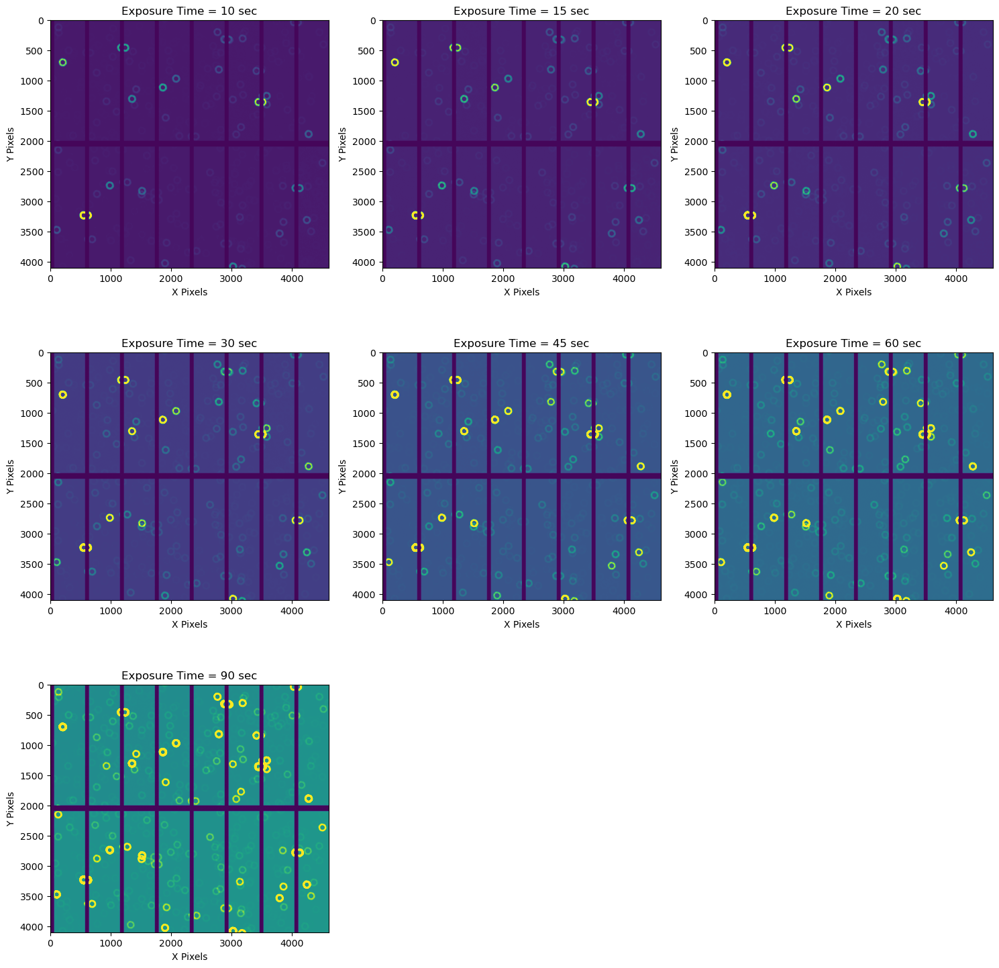

In [5]:
fig = plt.figure(figsize=(15, 15))
det_num = 4
for i, exp_time in zip(np.arange(1, 8), exp_times):
    fig.add_subplot(3,3,i)
    data_id['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id['detector'] = det_num
    data_id_visit['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['visit'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['detector'] = det_num
    post_isr = butler.get('raw', dataId=data_id, collections='LSSTComCamSim/raw/all')
    plt.imshow(post_isr.image.array, vmax=4000)
    plt.xlabel('X Pixels')
    plt.ylabel('Y Pixels')
    plt.title(f'Exposure Time = {exp_time} sec')
    # donut_cat = butler.get('donutCatalog', dataId=data_id_visit, collections='u/brycek/wet-013/wcsGaiaCatalog')
    # plt.scatter(donut_cat['centroid_x'], donut_cat['centroid_y'], c='r', marker='x')
plt.tight_layout()
#plt.savefig('figures/raw_det_4.png')

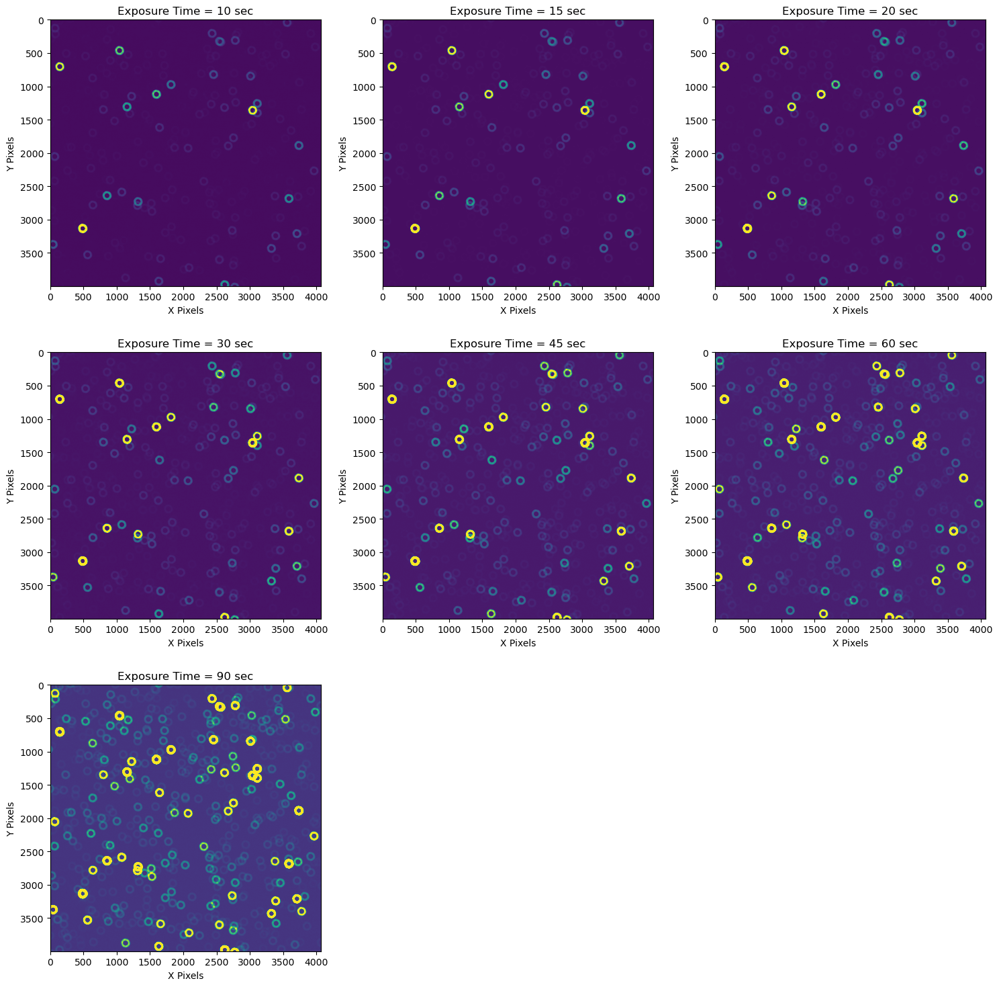

In [6]:
fig = plt.figure(figsize=(15, 15))
det_num = 4
for i, exp_time in zip(np.arange(1, 8), exp_times):
    fig.add_subplot(3,3,i)
    data_id['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id['detector'] = det_num
    data_id_visit['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['visit'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['detector'] = det_num
    post_isr = butler.get('postISRCCD', dataId=data_id, collections='WET-013/wcsGaiaCatalog')
    plt.imshow(post_isr.image.array, vmax=4000)
    plt.xlabel('X Pixels')
    plt.ylabel('Y Pixels')
    plt.title(f'Exposure Time = {exp_time} sec')
    # donut_cat = butler.get('donutCatalog', dataId=data_id_visit, collections='WET-013/wcsGaiaCatalog')
    # plt.scatter(donut_cat['centroid_x'], donut_cat['centroid_y'], c='r', marker='x')
plt.tight_layout()
#plt.savefig('figures/post_isr_det_4.png')

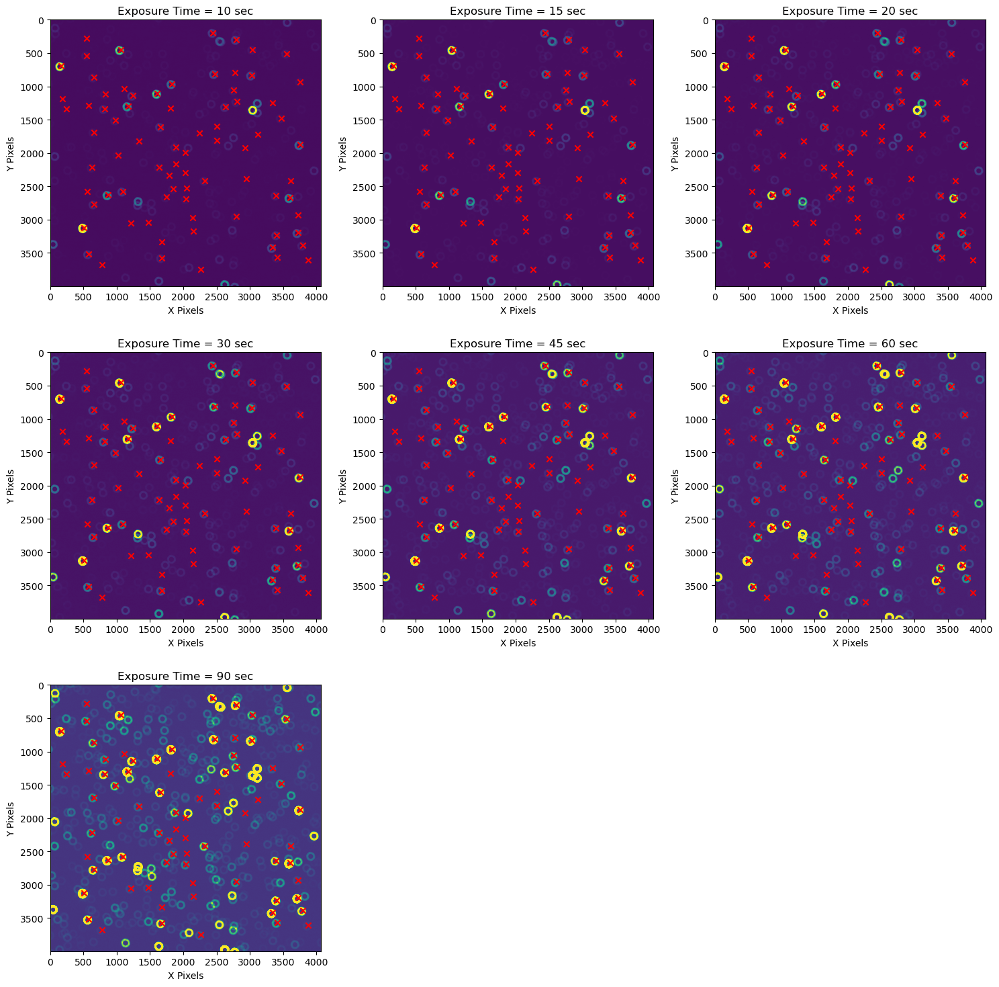

In [7]:
fig = plt.figure(figsize=(15, 15))
det_num = 4
for i, exp_time in zip(np.arange(1, 8), exp_times):
    fig.add_subplot(3,3,i)
    data_id['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id['detector'] = det_num
    data_id_visit['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['visit'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['detector'] = det_num
    post_isr = butler.get('postISRCCD', dataId=data_id, collections='WET-013/wcsGaiaCatalog')
    plt.imshow(post_isr.image.array, vmax=4000)
    plt.xlabel('X Pixels')
    plt.ylabel('Y Pixels')
    plt.title(f'Exposure Time = {exp_time} sec')
    donut_cat = butler.get('donutCatalog', dataId=data_id_visit, collections='WET-013/wcsGaiaCatalog')
    plt.scatter(donut_cat['centroid_x'], donut_cat['centroid_y'], c='r', marker='x')
plt.tight_layout()


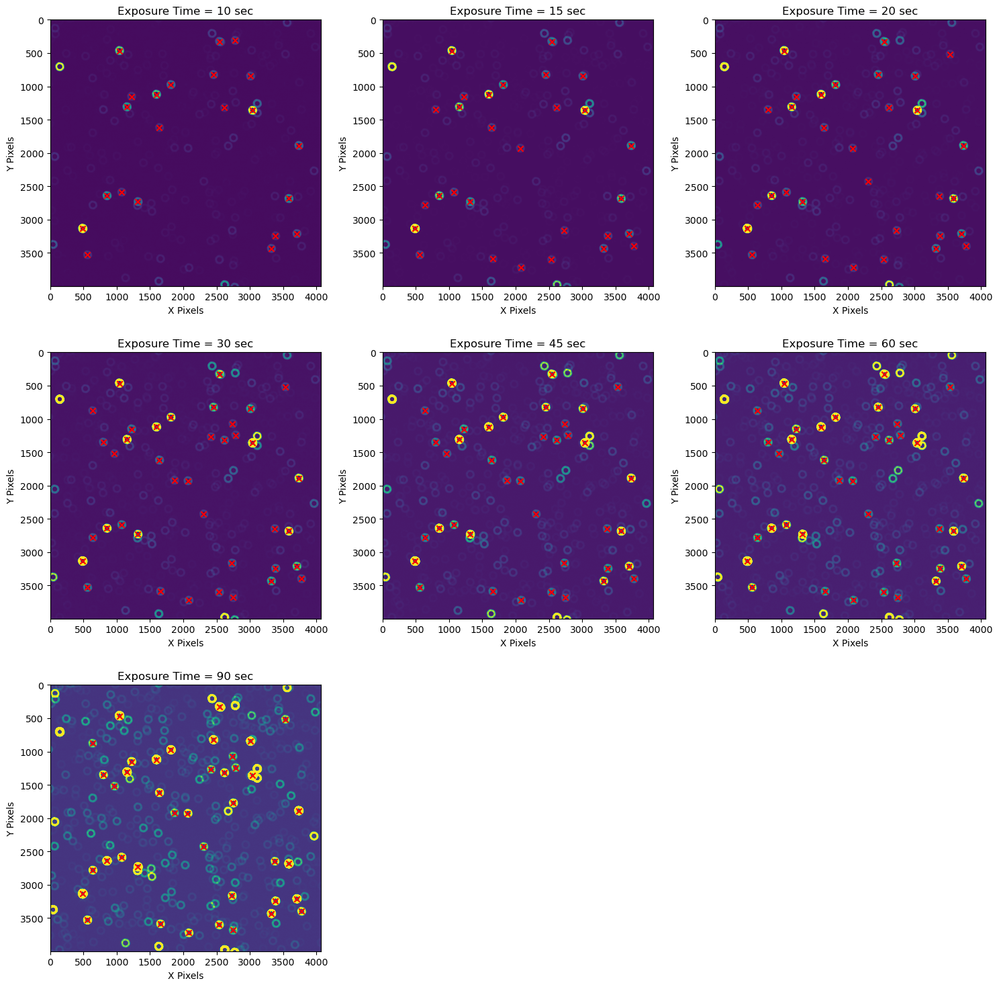

In [8]:
fig = plt.figure(figsize=(15, 15))
det_num = 4
for i, exp_time in zip(np.arange(1, 8), exp_times):
    fig.add_subplot(3,3,i)
    data_id['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id['detector'] = det_num
    data_id_visit['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['visit'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['detector'] = det_num
    post_isr = butler.get('postISRCCD', dataId=data_id, collections='WET-013/wcsGaiaCatalog')
    plt.imshow(post_isr.image.array, vmax=4000)
    plt.xlabel('X Pixels')
    plt.ylabel('Y Pixels')
    plt.title(f'Exposure Time = {exp_time} sec')
    donut_cat = butler.get('donutCatalog', dataId=data_id_visit, collections='WET-013/directDetectCatalog')
    plt.scatter(donut_cat['centroid_x'], donut_cat['centroid_y'], c='r', marker='x')
plt.tight_layout()

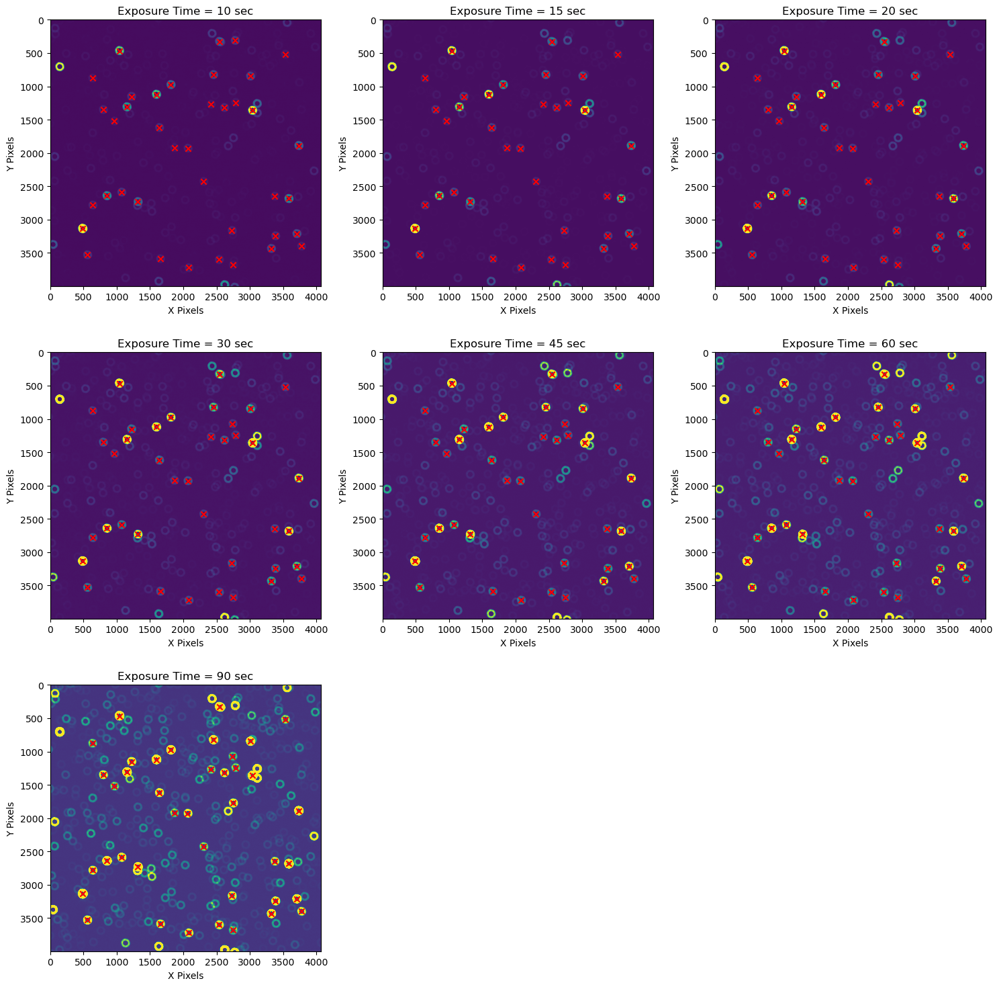

In [9]:
fig = plt.figure(figsize=(15, 15))
det_num = 4
for i, exp_time in zip(np.arange(1, 8), exp_times):
    fig.add_subplot(3,3,i)
    data_id['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id['detector'] = det_num
    data_id_visit['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['visit'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['detector'] = det_num
    post_isr = butler.get('postISRCCD', dataId=data_id, collections='WET-013/wcsGaiaCatalog')
    plt.imshow(post_isr.image.array, vmax=4000)
    plt.xlabel('X Pixels')
    plt.ylabel('Y Pixels')
    plt.title(f'Exposure Time = {exp_time} sec')
    donut_cat = butler.get('donutCatalog', dataId=data_id_visit, collections='WET-013/directDetectCatalog_NoMagLimit')
    plt.scatter(donut_cat['centroid_x'], donut_cat['centroid_y'], c='r', marker='x')
plt.tight_layout()

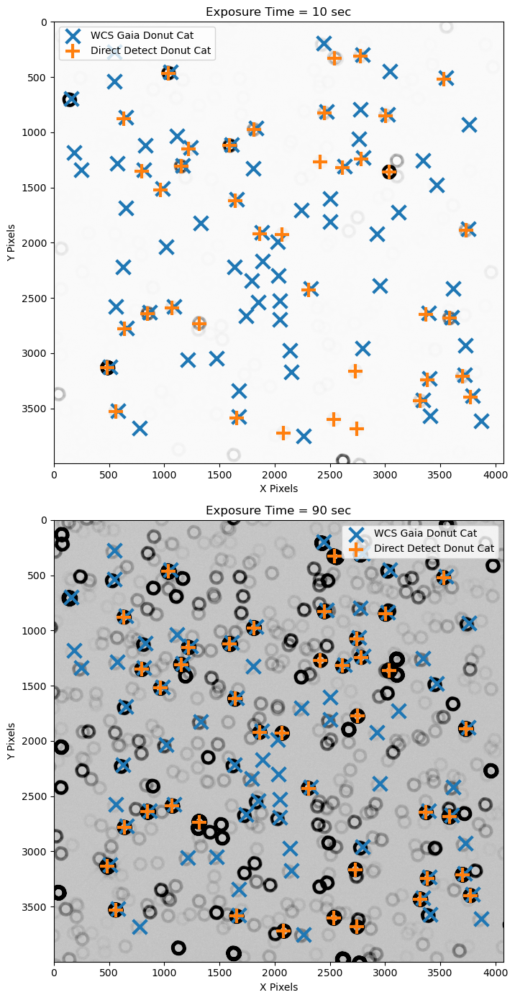

In [10]:
from astropy.coordinates import SkyCoord
from astropy import units as u
fig = plt.figure(figsize=(7, 14))
det_num = 4
j = 1
donut_cats_direct = []
for i, exp_time in zip([1, 7], [10, 90]):
    fig.add_subplot(2,1,j)
    data_id['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id['detector'] = det_num
    data_id_visit['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['visit'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['detector'] = det_num
    post_isr = butler.get('postISRCCD', dataId=data_id, collections='WET-013/wcsGaiaCatalog')
    plt.imshow(post_isr.image.array, vmax=3000, cmap=plt.get_cmap('Greys'))
    plt.xlabel('X Pixels')
    plt.ylabel('Y Pixels')
    plt.title(f'Exposure Time = {exp_time} sec')
    donut_cat_wcs = butler.get('donutCatalog', dataId=data_id_visit, collections='WET-013/wcsGaiaCatalog')
    donut_cat_direct = butler.get('donutCatalog', dataId=data_id_visit, collections='WET-013/directDetectCatalog_NoMagLimit')
    plt.scatter(donut_cat_wcs['centroid_x'], donut_cat_wcs['centroid_y'], c='C0', marker='x', s=200, lw=3, label='WCS Gaia Donut Cat')
    plt.scatter(donut_cat_direct['centroid_x'], donut_cat_direct['centroid_y'], c='C1', marker='+', s=200, lw=3, label='Direct Detect Donut Cat')
    donut_cats_direct.append(SkyCoord(ra=donut_cat_direct['coord_ra'].values*u.rad, dec=donut_cat_direct['coord_dec'].values*u.rad))
    plt.legend()
    j+=1
plt.tight_layout()
#plt.savefig(f'figures/wcs_direct_10_90_comparison_det_{det_num}.png')

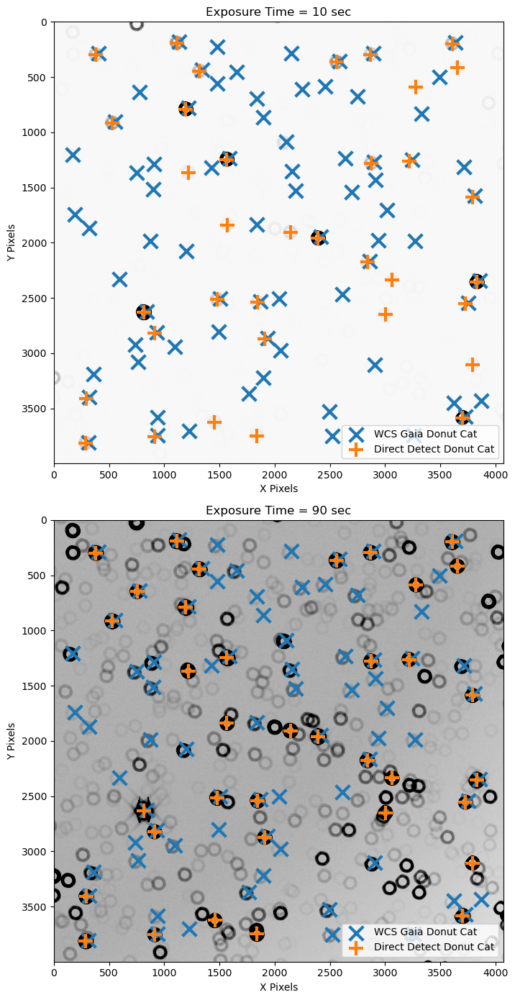

In [11]:
from astropy.coordinates import SkyCoord
from astropy import units as u
fig = plt.figure(figsize=(7, 14))
det_num = 8
j = 1
donut_cats_direct = []
for i, exp_time in zip([1, 7], [10, 90]):
    fig.add_subplot(2,1,j)
    data_id['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id['detector'] = det_num
    data_id_visit['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['visit'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['detector'] = det_num
    post_isr = butler.get('postISRCCD', dataId=data_id, collections='WET-013/wcsGaiaCatalog')
    plt.imshow(post_isr.image.array, vmax=3000, cmap=plt.get_cmap('Greys'))
    plt.xlabel('X Pixels')
    plt.ylabel('Y Pixels')
    plt.title(f'Exposure Time = {exp_time} sec')
    donut_cat_wcs = butler.get('donutCatalog', dataId=data_id_visit, collections='WET-013/wcsGaiaCatalog')
    donut_cat_direct = butler.get('donutCatalog', dataId=data_id_visit, collections='WET-013/directDetectCatalog_NoMagLimit')
    plt.scatter(donut_cat_wcs['centroid_x'], donut_cat_wcs['centroid_y'], c='C0', marker='x', s=200, lw=3, label='WCS Gaia Donut Cat')
    plt.scatter(donut_cat_direct['centroid_x'], donut_cat_direct['centroid_y'], c='C1', marker='+', s=200, lw=3, label='Direct Detect Donut Cat')
    donut_cats_direct.append(SkyCoord(ra=donut_cat_direct['coord_ra'].values*u.rad, dec=donut_cat_direct['coord_dec'].values*u.rad))
    plt.legend()
    j+=1
plt.tight_layout()
#plt.savefig(f'figures/wcs_direct_10_90_comparison_det_{det_num}.png')

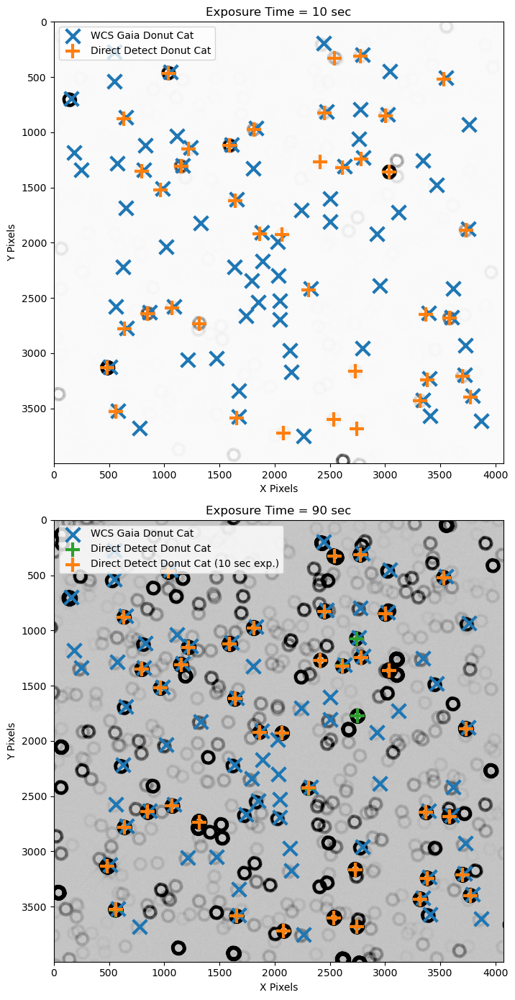

In [12]:
from astropy.coordinates import SkyCoord
from astropy import units as u
fig = plt.figure(figsize=(7, 14))
det_num = 4
j = 1
donut_cats_direct = {}
skycoord_dict = {}
for i, exp_time in zip([1, 7], [10, 90]):
    fig.add_subplot(2,1,j)
    data_id['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id['detector'] = det_num
    data_id_visit['exposure'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['visit'] = 7024072600000 + 3 + 3*(i-1)
    data_id_visit['detector'] = det_num
    post_isr = butler.get('postISRCCD', dataId=data_id, collections='WET-013/wcsGaiaCatalog')
    plt.imshow(post_isr.image.array, vmax=3000, cmap=plt.get_cmap('Greys'))
    plt.xlabel('X Pixels')
    plt.ylabel('Y Pixels')
    plt.title(f'Exposure Time = {exp_time} sec')
    donut_cat_wcs = butler.get('donutCatalog', dataId=data_id_visit, collections='WET-013/wcsGaiaCatalog')
    donut_cat_direct = butler.get('donutCatalog', dataId=data_id_visit, collections='WET-013/directDetectCatalog_NoMagLimit')
    plt.scatter(donut_cat_wcs['centroid_x'], donut_cat_wcs['centroid_y'], c='C0', marker='x', s=200, lw=3, label='WCS Gaia Donut Cat')
    if exp_time == 10:
        plt.scatter(donut_cat_direct['centroid_x'], donut_cat_direct['centroid_y'], c='C1', marker='+', s=200, lw=3, label='Direct Detect Donut Cat')
    if exp_time == 90:
        plt.scatter(donut_cat_direct['centroid_x'], donut_cat_direct['centroid_y'], c='C2', marker='+', s=200, lw=3, label='Direct Detect Donut Cat')
        plt.scatter(donut_cats_direct[10]['centroid_x'], donut_cats_direct[10]['centroid_y'], c='C1', marker='+', s=200, lw=3, label='Direct Detect Donut Cat (10 sec exp.)')
    donut_cats_direct[exp_time] = donut_cat_direct
    skycoord_dict[exp_time] = SkyCoord(ra=donut_cat_direct['coord_ra'].values*u.rad, dec=donut_cat_direct['coord_dec'].values*u.rad)
    plt.legend()
    j+=1
plt.tight_layout()

In [13]:
idx, d2d, d3d = skycoord_dict[90].match_to_catalog_sky(skycoord_dict[10])

In [14]:
idx

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17,
       18, 19, 20, 21, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 33])

In [15]:
max_sep = 2*u.arcsec

In [16]:
sep_constraint = d2d < max_sep

In [17]:
idx_in_both = idx[sep_constraint]

In [18]:
donut_cat_10_and_90 = donut_cats_direct[90].iloc[idx_in_both]

In [19]:
donut_cat_10_and_90

,coord_ra,coord_dec,centroid_x,centroid_y,detector,source_flux,blend_centroid_x,blend_centroid_y
0,3.694940,-0.465027,486.121456,3133.312603,R22_S11,8.520252e+08,[],[]
1,3.691759,-0.466039,3039.773584,1360.449006,R22_S11,3.739173e+08,[],[]
2,3.693603,-0.467387,1038.661728,465.145999,R22_S11,2.342409e+08,[],[]
3,3.693208,-0.466631,1592.975021,1121.048957,R22_S11,2.148358e+08,[],[]
4,3.693725,-0.466567,1151.492552,1309.684550,R22_S11,1.641568e+08,[],[]
5,3.694418,-0.465396,851.092029,2641.114931,R22_S11,1.499532e+08,[],[]
6,3.691567,-0.464662,3582.361167,2684.172480,R22_S11,1.387167e+08,[],[]
7,3.693956,-0.465190,1316.716365,2734.203173,R22_S11,1.073775e+08,[],[]
8,3.692937,-0.466712,1811.584470,975.635462,R22_S11,1.023775e+08,[],[]
9,3.691184,-0.465368,3731.646215,1888.889304,R22_S11,9.283558e+07,[],[]


In [20]:
set_in_both = set(idx_in_both)

In [21]:
set_in_90 = set(donut_cats_direct[90].index.values)

In [22]:
set_in_90 - set_in_both

{15, 39}

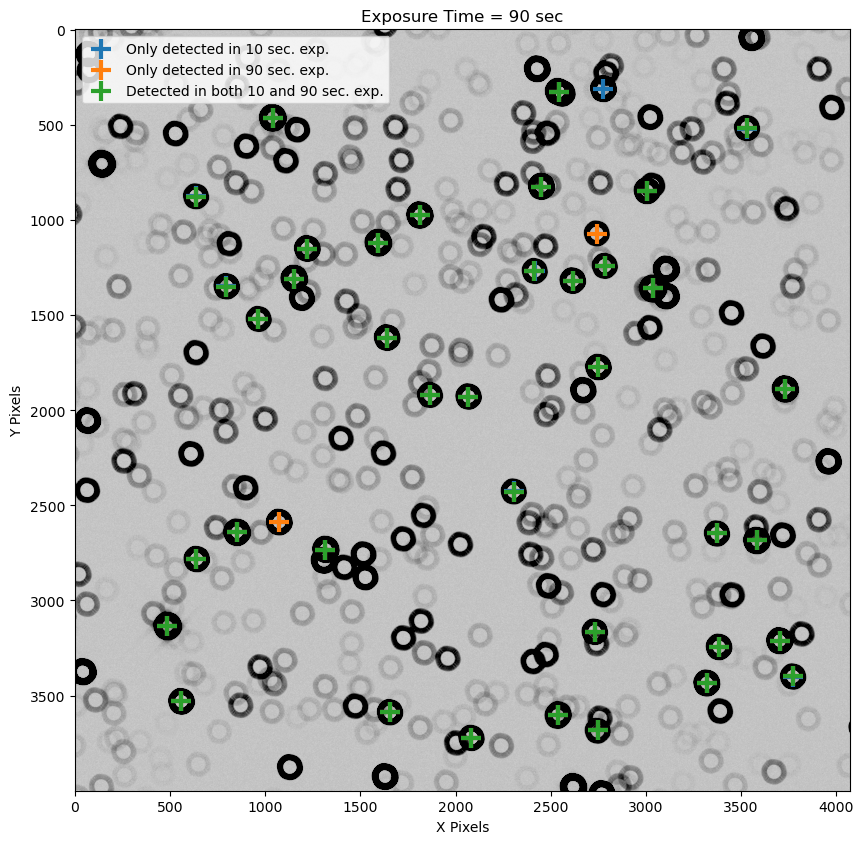

In [23]:
fig = plt.figure(figsize=(10, 10))
data_id['exposure'] = 7024072600000 + 21
data_id['detector'] = det_num
data_id_visit['exposure'] = 7024072600000 + 21
data_id_visit['visit'] = 7024072600000 + 21
data_id_visit['detector'] = det_num

post_isr = butler.get('postISRCCD', dataId=data_id, collections='WET-013/wcsGaiaCatalog')
plt.imshow(post_isr.image.array, vmax=3000, cmap=plt.get_cmap('Greys'))
plt.xlabel('X Pixels')
plt.ylabel('Y Pixels')
plt.title(f'Exposure Time = {exp_time} sec')

plt.scatter(donut_cats_direct[10]['centroid_x'], donut_cats_direct[10]['centroid_y'], c='C0', marker='+', s=200, lw=3, label='Only detected in 10 sec. exp.')
plt.scatter(donut_cats_direct[90]['centroid_x'], donut_cats_direct[90]['centroid_y'], c='C1', marker='+', s=200, lw=3, label='Only detected in 90 sec. exp.')
plt.scatter(donut_cat_10_and_90['centroid_x'], donut_cat_10_and_90['centroid_y'], c='C2', marker='+', s=200, lw=3, label='Detected in both 10 and 90 sec. exp.')
plt.legend()

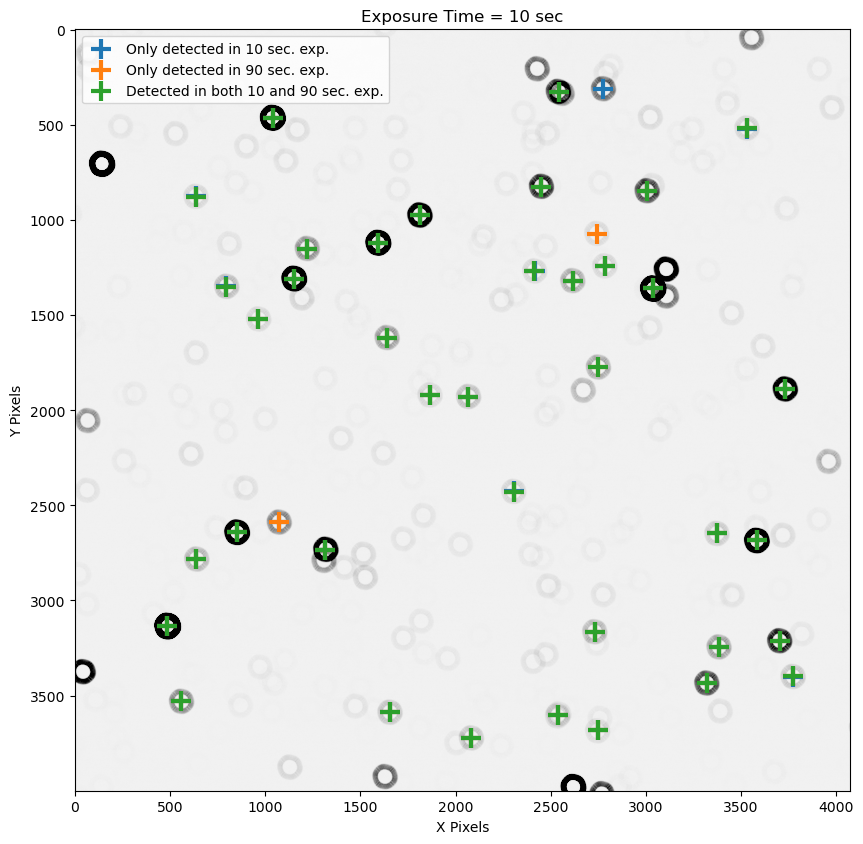

In [24]:
fig = plt.figure(figsize=(10, 10))
data_id['exposure'] = 7024072600000 + 3
data_id['detector'] = det_num
data_id_visit['exposure'] = 7024072600000 + 3
data_id_visit['visit'] = 7024072600000 + 3
data_id_visit['detector'] = det_num

exp_time = 10
post_isr = butler.get('postISRCCD', dataId=data_id, collections='WET-013/wcsGaiaCatalog')
plt.imshow(post_isr.image.array, vmax=1200, cmap=plt.get_cmap('Greys'))
plt.xlabel('X Pixels')
plt.ylabel('Y Pixels')
plt.title(f'Exposure Time = {exp_time} sec')

plt.scatter(donut_cats_direct[10]['centroid_x'], donut_cats_direct[10]['centroid_y'], c='C0', marker='+', s=200, lw=3, label='Only detected in 10 sec. exp.')
plt.scatter(donut_cats_direct[90]['centroid_x'], donut_cats_direct[90]['centroid_y'], c='C1', marker='+', s=200, lw=3, label='Only detected in 90 sec. exp.')
plt.scatter(donut_cat_10_and_90['centroid_x'], donut_cat_10_and_90['centroid_y'], c='C2', marker='+', s=200, lw=3, label='Detected in both 10 and 90 sec. exp.')
plt.legend()

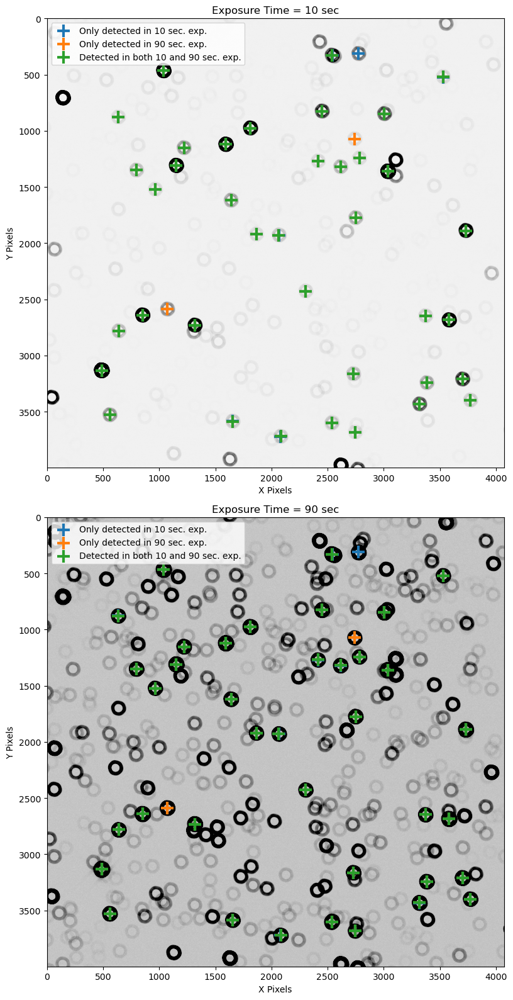

In [25]:
det_num = 4
fig = plt.figure(figsize=(8, 16))
fig.add_subplot(2,1,1)
data_id['exposure'] = 7024072600000 + 3
data_id['detector'] = det_num
data_id_visit['exposure'] = 7024072600000 + 3
data_id_visit['visit'] = 7024072600000 + 3
data_id_visit['detector'] = det_num

exp_time = 10
post_isr = butler.get('postISRCCD', dataId=data_id, collections='WET-013/wcsGaiaCatalog')
plt.imshow(post_isr.image.array, vmax=1200, cmap=plt.get_cmap('Greys'))
plt.xlabel('X Pixels')
plt.ylabel('Y Pixels')
plt.title(f'Exposure Time = {exp_time} sec')

plt.scatter(donut_cats_direct[10]['centroid_x'], donut_cats_direct[10]['centroid_y'], c='C0', marker='+', s=200, lw=3, label='Only detected in 10 sec. exp.')
plt.scatter(donut_cats_direct[90]['centroid_x'], donut_cats_direct[90]['centroid_y'], c='C1', marker='+', s=200, lw=3, label='Only detected in 90 sec. exp.')
plt.scatter(donut_cat_10_and_90['centroid_x'], donut_cat_10_and_90['centroid_y'], c='C2', marker='+', s=200, lw=3, label='Detected in both 10 and 90 sec. exp.')
plt.legend()

fig.add_subplot(2,1,2)
data_id['exposure'] = 7024072600000 + 21
data_id['detector'] = det_num
data_id_visit['exposure'] = 7024072600000 + 21
data_id_visit['visit'] = 7024072600000 + 21
data_id_visit['detector'] = det_num

exp_time = 90
post_isr = butler.get('postISRCCD', dataId=data_id, collections='WET-013/wcsGaiaCatalog')
plt.imshow(post_isr.image.array, vmax=3000, cmap=plt.get_cmap('Greys'))
plt.xlabel('X Pixels')
plt.ylabel('Y Pixels')
plt.title(f'Exposure Time = {exp_time} sec')

plt.scatter(donut_cats_direct[10]['centroid_x'], donut_cats_direct[10]['centroid_y'], c='C0', marker='+', s=200, lw=3, label='Only detected in 10 sec. exp.')
plt.scatter(donut_cats_direct[90]['centroid_x'], donut_cats_direct[90]['centroid_y'], c='C1', marker='+', s=200, lw=3, label='Only detected in 90 sec. exp.')
plt.scatter(donut_cat_10_and_90['centroid_x'], donut_cat_10_and_90['centroid_y'], c='C2', marker='+', s=200, lw=3, label='Detected in both 10 and 90 sec. exp.')
plt.legend()

plt.tight_layout()

In [ ]:
# Cut out donut stamps for the single catalogs objects across all detectors.
# Can force detection by using the custom catalogs on each image 

In [5]:
zern_avg_wcs = {}
zern_avg_direct = {}
zern_raw_wcs = {}
zern_raw_direct = {}
zern_metadata_wcs = {}
zern_metadata_direct = {}
data_id_dict = {}
data_id_visit_dict = {}
donut_stamps_extra_wcs = {}
donut_stamps_intra_wcs = {}
donut_stamps_extra_direct = {}
donut_stamps_intra_direct = {}
for det_num in range(9):
    zern_avg_wcs[det_num] = {}
    zern_avg_direct[det_num] = {}
    zern_raw_wcs[det_num] = {}
    zern_raw_direct[det_num] = {}
    zern_metadata_wcs[det_num] = {}
    zern_metadata_direct[det_num] = {}
    data_id_dict[det_num] = {}
    data_id_visit_dict[det_num] = {}
    donut_stamps_extra_wcs[det_num] = {}
    donut_stamps_intra_wcs[det_num] = {}
    donut_stamps_extra_direct[det_num] = {}
    donut_stamps_intra_direct[det_num] = {}
    for i, exp_time in zip(np.arange(1, 8), exp_times):
        data_id['exposure'] = 7024072600000 + 3 + 3*(i-1)
        data_id['detector'] = det_num
        data_id_visit['exposure'] = 7024072600000 + 3 + 3*(i-1)
        data_id_visit['visit'] = 7024072600000 + 3 + 3*(i-1)
        data_id_visit['detector'] = det_num
        data_id_dict[det_num][exp_time] = data_id
        data_id_visit_dict[det_num][exp_time] = data_id_visit
        if exp_time in (10, 60, 90):
            donut_stamps_extra_wcs[det_num][exp_time] = butler.get('donutStampsExtra', dataId=data_id_visit, collections='WET-013/wcsGaiaCatalog')
            donut_stamps_intra_wcs[det_num][exp_time] = butler.get('donutStampsIntra', dataId=data_id_visit, collections='WET-013/wcsGaiaCatalog')
            donut_stamps_extra_direct[det_num][exp_time] = butler.get('donutStampsExtra', dataId=data_id_visit, collections='WET-013/directDetectCatalog_NoMagLimit')
            donut_stamps_intra_direct[det_num][exp_time] = butler.get('donutStampsIntra', dataId=data_id_visit, collections='WET-013/directDetectCatalog_NoMagLimit')
        zern_avg_wcs[det_num][exp_time] = butler.get('zernikeEstimateAvg', dataId=data_id_visit, collections='WET-013/wcsGaiaCatalog')
        zern_avg_direct[det_num][exp_time] = butler.get('zernikeEstimateAvg', dataId=data_id_visit, collections='WET-013/directDetectCatalog_NoMagLimit')
        zern_raw_wcs[det_num][exp_time] = butler.get('zernikeEstimateRaw', dataId=data_id_visit, collections='WET-013/wcsGaiaCatalog')
        zern_raw_direct[det_num][exp_time] = butler.get('zernikeEstimateRaw', dataId=data_id_visit, collections='WET-013/directDetectCatalog_NoMagLimit')
        zern_metadata_wcs[det_num][exp_time] = butler.get('calcZernikesTask_metadata', dataId=data_id_visit, collections='WET-013/wcsGaiaCatalog')['calcZernikesTask:combineZernikes'].to_dict()
        zern_metadata_direct[det_num][exp_time] = butler.get('calcZernikesTask_metadata', dataId=data_id_visit, collections='WET-013/directDetectCatalog_NoMagLimit')['calcZernikesTask:combineZernikes'].to_dict()

In [42]:
zern_metadata_direct[0][10]

{'maxZernClip': 3.0,
 'effMaxZernClip': 3.0,
 'numDonutsTotal': 29.0,
 'numDonutsUsed': 20.0,
 'numDonutsRejected': 9.0,
 'combineZernikesFlags': [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  1.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  1.0,
  0.0,
  1.0,
  1.0,
  0.0,
  1.0,
  1.0,
  1.0,
  1.0,
  1.0,
  0.0]}

In [48]:
total_wcs_donuts = []
total_direct_donuts = []
accepted_wcs_donuts = []
accepted_direct_donuts = []
for det_num in range(9):
    total_wcs_donuts.append([x['numDonutsTotal'] for x in zern_metadata_wcs[det_num].values()])
    total_direct_donuts.append([x['numDonutsTotal'] for x in zern_metadata_direct[det_num].values()])
    accepted_wcs_donuts.append([x['numDonutsUsed'] for x in zern_metadata_wcs[det_num].values()])
    accepted_direct_donuts.append([x['numDonutsUsed'] for x in zern_metadata_direct[det_num].values()])
total_wcs_donuts = np.array(total_wcs_donuts)
total_direct_donuts = np.array(total_direct_donuts)
accepted_wcs_donuts = np.array(accepted_wcs_donuts)
accepted_direct_donuts = np.array(accepted_direct_donuts)

In [7]:
opd_fits = fits.open('opd.fits')

det_opd = {}
for det_num in range(9):
    det_header = opd_fits[det_num].header

    opd = []
    for j in range(4, 29):
        opd.append(det_header[f'AZ_{j:03}']*1e-3)    
    det_opd[det_num] = np.array(opd)

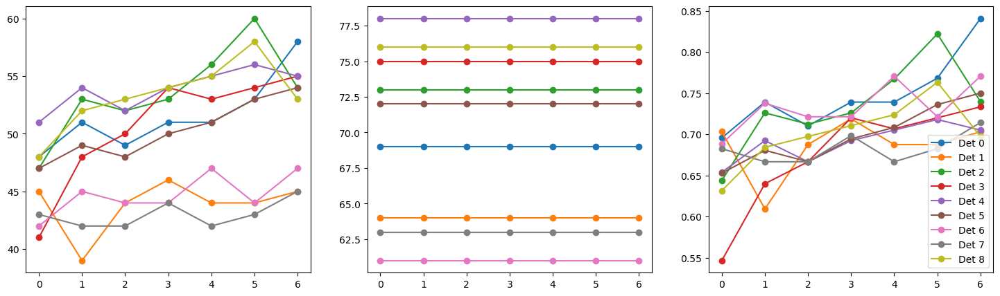

In [8]:
fig = plt.figure(figsize=(18, 5))
fig.add_subplot(1,3,1)
for det_num in range(9):
    plt.plot([x['numDonutsUsed'] for x in zern_metadata_wcs[det_num].values()], '-o')
fig.add_subplot(1,3,2)
for det_num in range(9):
    plt.plot([x['numDonutsTotal'] for x in zern_metadata_wcs[det_num].values()], '-o')
fig.add_subplot(1,3,3)
for det_num in range(9):
    plt.plot([x['numDonutsUsed']/x['numDonutsTotal'] for x in zern_metadata_wcs[det_num].values()], '-o', label=f'Det {det_num}')
    plt.legend()

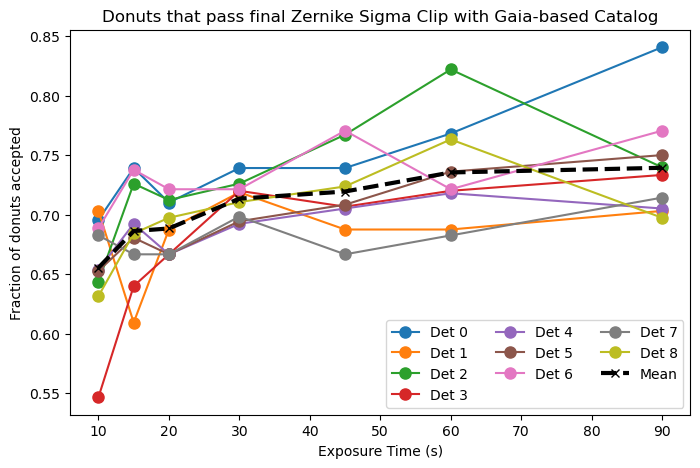

In [10]:
fig = plt.figure(figsize=(8, 5))

for det_num in range(9):
    plt.plot(exp_times, [x['numDonutsUsed']/x['numDonutsTotal'] for x in zern_metadata_wcs[det_num].values()], '-o', label=f'Det {det_num}', markersize=8)
plt.plot(exp_times, np.mean(accepted_wcs_donuts/total_wcs_donuts, axis=0), '--x', c='k', lw=3, label='Mean')
plt.legend(ncol=3)
plt.xlabel('Exposure Time (s)')
plt.ylabel('Fraction of donuts accepted')
plt.title('Donuts that pass final Zernike Sigma Clip with Gaia-based Catalog')
#plt.savefig('figures/sigma_clip_accepted_gaia_based.png')

Text(0.5, 1.0, 'Donuts that pass final Zernike Sigma Clip with Gaia-based Catalog')

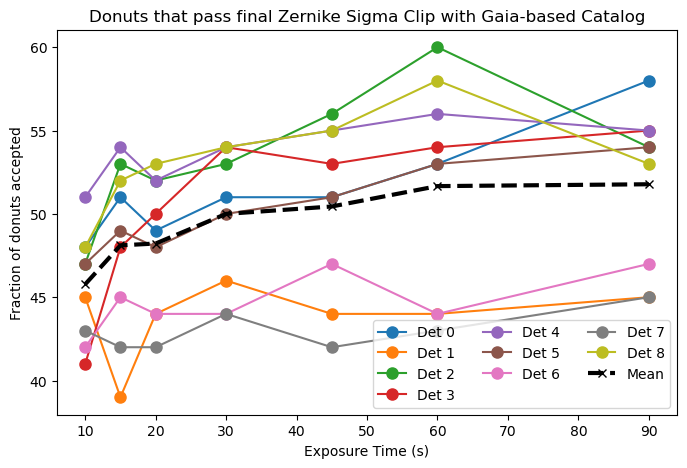

In [64]:
fig = plt.figure(figsize=(8, 5))

for det_num in range(9):
    plt.plot(exp_times, [x['numDonutsUsed'] for x in zern_metadata_wcs[det_num].values()], '-o', label=f'Det {det_num}', markersize=8)
plt.plot(exp_times, np.mean(accepted_wcs_donuts, axis=0), '--x', c='k', lw=3, label='Mean')
plt.legend(ncol=3)
plt.xlabel('Exposure Time (s)')
plt.ylabel('Fraction of donuts accepted')
plt.title('Donuts that pass final Zernike Sigma Clip with Gaia-based Catalog')
#plt.savefig('figures/sigma_clip_accepted_gaia_based.png')

In [67]:
flag_diff_2 = np.array(zern_metadata_wcs[2][90]['combineZernikesFlags']) - np.array(zern_metadata_wcs[2][60]['combineZernikesFlags'])

In [68]:
flag_diff_2

array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       1., 0., 0., 0., 0.])

In [69]:
dropped_idx = np.where(flag_diff_2 == 1)[0]
print(dropped_idx)

[ 0 31 53 54 67 68]


In [70]:
kept_90 = np.where(np.array(zern_metadata_wcs[2][90]['combineZernikesFlags']) == 0.)
kept_60 = np.where(np.array(zern_metadata_wcs[2][60]['combineZernikesFlags']) == 0.)

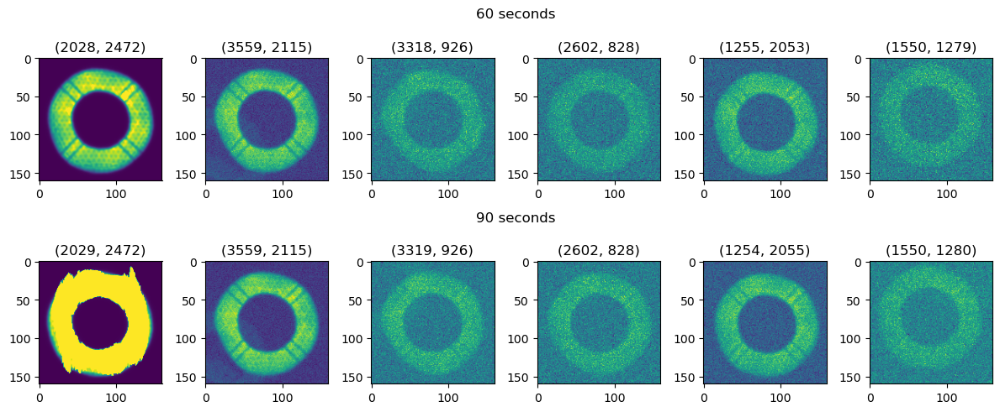

In [94]:
fig = plt.figure(figsize=(12,5))
fig.add_subplot(2, 1, 1)
plt.gca().axis('off')
plt.title('60 seconds', pad=20)
for i in range(6):
    fig.add_subplot(2, 6, i+1)
    plt.imshow(donut_stamps_extra_wcs[2][60][dropped_idx[i]].stamp_im.image.array)
    plt.title(donut_stamps_extra_wcs[2][60][dropped_idx[i]].centroid_position)
fig.add_subplot(2, 1, 2)
plt.gca().axis('off')
plt.title('90 seconds', pad=20)
for i in range(6):
    fig.add_subplot(2, 6, i+7)
    plt.imshow(donut_stamps_extra_wcs[2][90][dropped_idx[i]].stamp_im.image.array)
    plt.title(donut_stamps_extra_wcs[2][90][dropped_idx[i]].centroid_position)
plt.tight_layout()

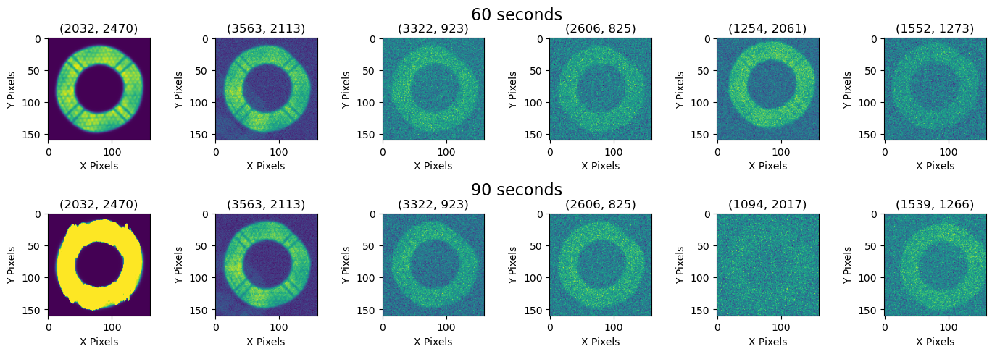

In [115]:
fig = plt.figure(figsize=(14,5))
fig.add_subplot(2, 1, 1)
plt.gca().axis('off')
plt.title('60 seconds', pad=18, size=16)
for i in range(6):
    fig.add_subplot(2, 6, i+1)
    plt.imshow(donut_stamps_intra_wcs[2][60][dropped_idx[i]].stamp_im.image.array)
    plt.title(donut_stamps_intra_wcs[2][60][dropped_idx[i]].centroid_position)
    plt.xlabel('X Pixels')
    plt.ylabel('Y Pixels')
fig.add_subplot(2, 1, 2)
plt.gca().axis('off')
plt.title('90 seconds', pad=18, size=16)
for i in range(6):
    fig.add_subplot(2, 6, i+7)
    plt.imshow(donut_stamps_intra_wcs[2][90][dropped_idx[i]].stamp_im.image.array)
    plt.title(donut_stamps_intra_wcs[2][90][dropped_idx[i]].centroid_position)
    plt.xlabel('X Pixels')
    plt.ylabel('Y Pixels')
plt.tight_layout()
#plt.savefig('figures/stamp_rejected_60_90_det_2.png')

IndexError: index 6 is out of bounds for axis 0 with size 6

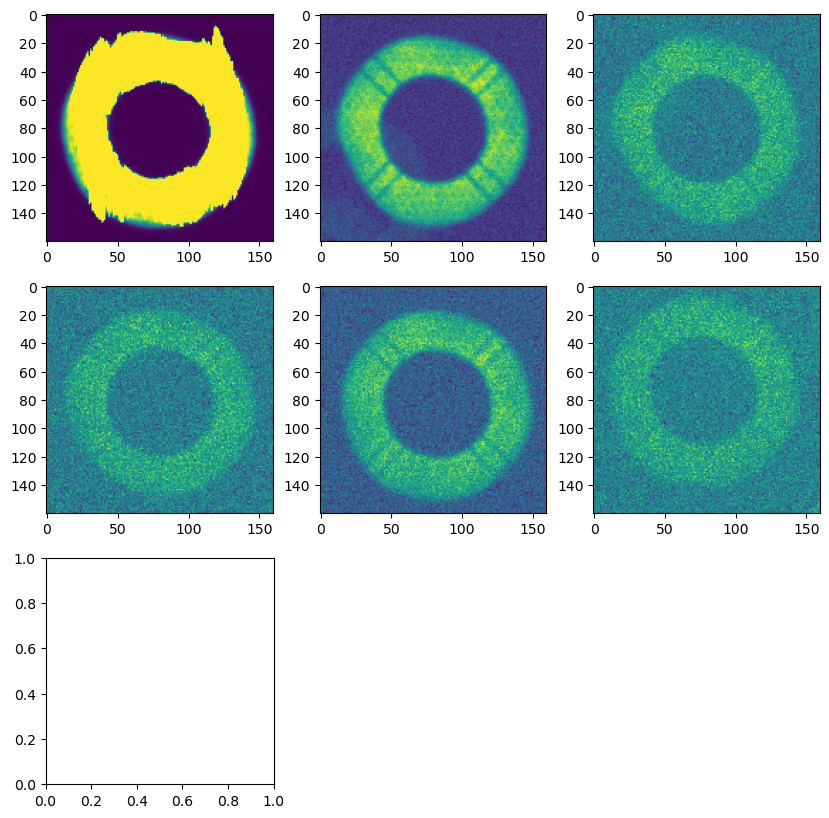

In [24]:
dropped_idx = np.where(flag_diff_2 == 1)[0]
fig = plt.figure(figsize=(10,10))
for i in range(22):
    fig.add_subplot(3, 3, i+1)
    plt.imshow(donut_stamps_extra_wcs[2][90][dropped_idx[i]].stamp_im.image.array)
plt.tight_layout()

IndexError: index 6 is out of bounds for axis 0 with size 6

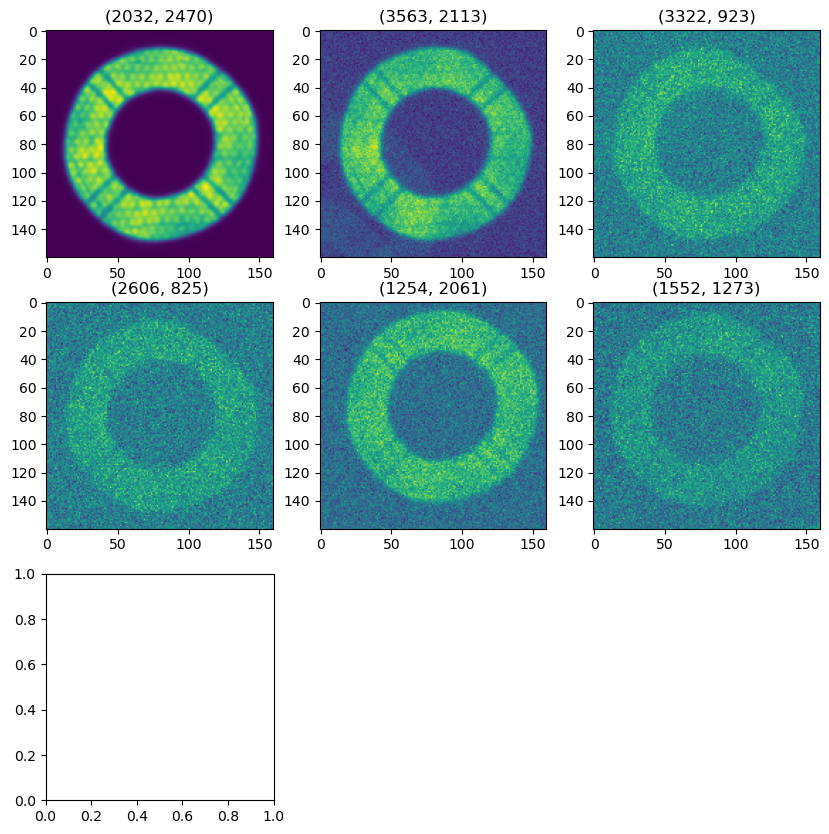

In [25]:
dropped_idx = np.where(flag_diff_2 == 1)[0]
fig = plt.figure(figsize=(10,10))
for i in range(22):
    fig.add_subplot(3, 3, i+1)
    plt.imshow(donut_stamps_intra_wcs[2][60][dropped_idx[i]].stamp_im.image.array)
    plt.title(donut_stamps_intra_wcs[2][60][dropped_idx[i]].centroid_position)
plt.tight_layout()

IndexError: index 6 is out of bounds for axis 0 with size 6

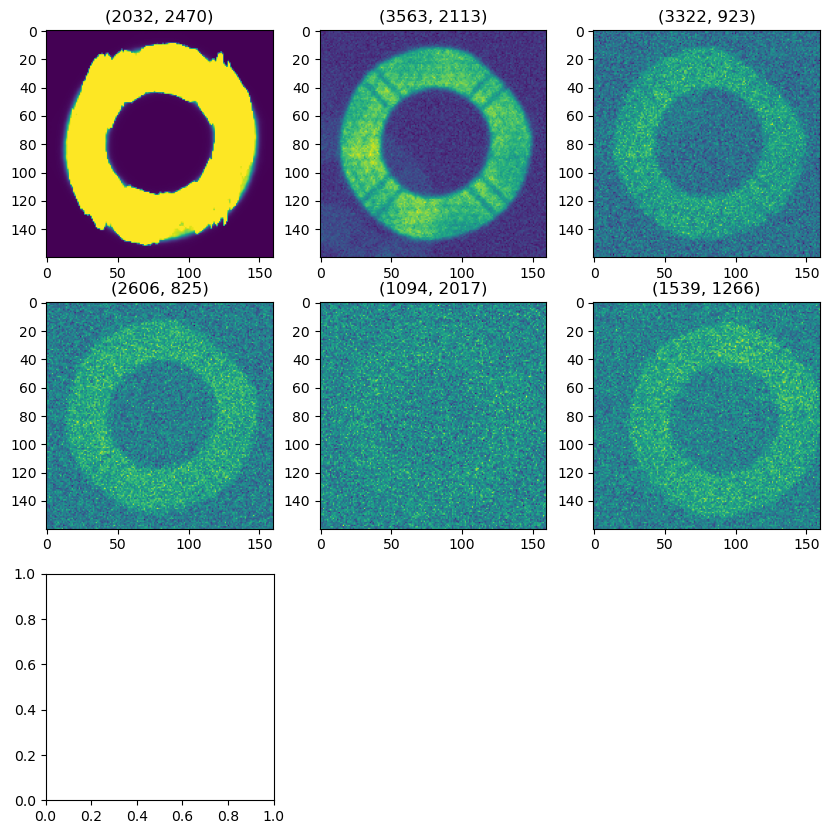

In [26]:
dropped_idx = np.where(flag_diff_2 == 1)[0]
fig = plt.figure(figsize=(10,10))
for i in range(22):
    fig.add_subplot(3, 3, i+1)
    plt.imshow(donut_stamps_intra_wcs[2][90][dropped_idx[i]].stamp_im.image.array)
    plt.title(donut_stamps_intra_wcs[2][90][dropped_idx[i]].centroid_position)
plt.tight_layout()

(3.0, 9.0)

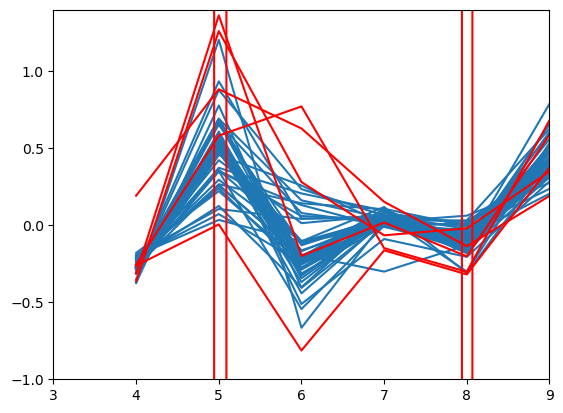

In [47]:
fig = plt.figure()
for i in kept_90[0]:
    plt.plot(np.arange(4, 29), zern_raw_wcs[2][90][i], c='C0')#, label=f'{exp_time} secs.')
for i in dropped_idx:
    plt.plot(np.arange(4, 29), zern_raw_wcs[2][90][i], c='r')#, label=f'{exp_time} secs.')
#plt.plot(np.arange(4, 29), det_opd[2], label='OPD')
plt.ylim(-1, 1.4)
plt.xlim(3, 9)

In [48]:
kept_both = set(kept_60[0]).intersection(set(kept_90[0]))

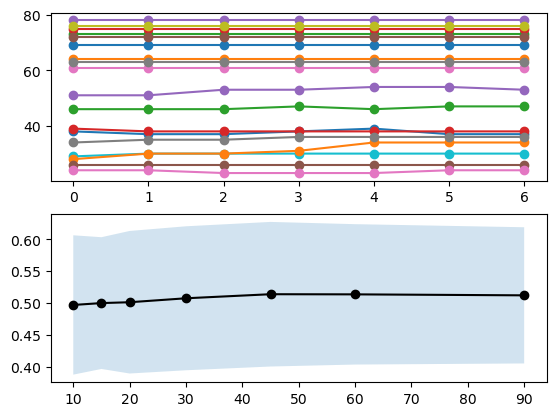

In [41]:
fig = plt.figure()

fig.add_subplot(2,1,1)
plt.plot(np.array(total_wcs_donuts).T, '-o', label='WCS Catalog Size')
plt.plot(np.array(total_direct_donuts).T, '-o', label='Direct Detect Catalog Size')

fig.add_subplot(2,1,2)
detect_ratio = np.array(total_direct_donuts)/np.array(total_wcs_donuts)
detect_ratio_mean = np.mean(detect_ratio, axis=0)
detect_ratio_stdev = np.std(detect_ratio, axis=0)
plt.plot(exp_times, detect_ratio_mean, '-o', c='k')
plt.fill_between(exp_times, detect_ratio_mean-detect_ratio_stdev, detect_ratio_mean+detect_ratio_stdev, alpha=0.2)

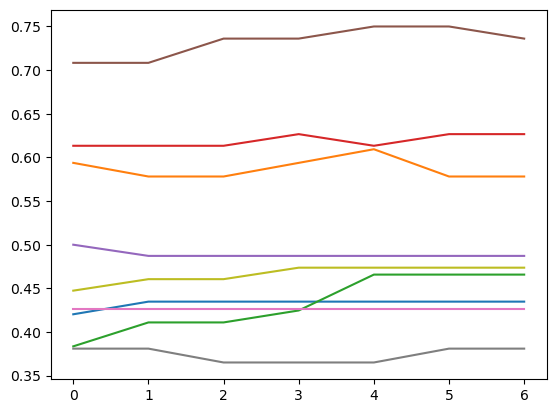

In [42]:
plt.plot(np.array(detect_ratio).T)

In [43]:
detect_ratio_stdev

array([0.10916665, 0.10320923, 0.11166884, 0.11279204, 0.11327857,
       0.10997686, 0.10669895])

In [44]:
total_wcs_donuts

array([[69., 69., 69., 69., 69., 69., 69.],
       [64., 64., 64., 64., 64., 64., 64.],
       [73., 73., 73., 73., 73., 73., 73.],
       [75., 75., 75., 75., 75., 75., 75.],
       [78., 78., 78., 78., 78., 78., 78.],
       [72., 72., 72., 72., 72., 72., 72.],
       [61., 61., 61., 61., 61., 61., 61.],
       [63., 63., 63., 63., 63., 63., 63.],
       [76., 76., 76., 76., 76., 76., 76.]])

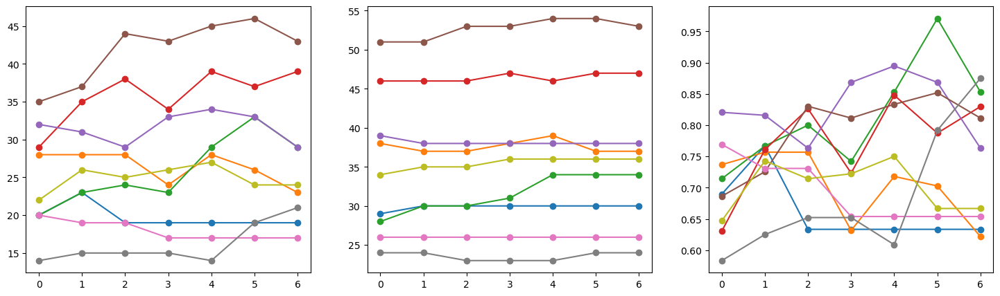

In [45]:
fig = plt.figure(figsize=(18, 5))
fig.add_subplot(1,3,1)
for det_num in range(9):
    plt.plot([x['numDonutsUsed'] for x in zern_metadata_direct[det_num].values()], '-o')
fig.add_subplot(1,3,2)
for det_num in range(9):
    plt.plot([x['numDonutsTotal'] for x in zern_metadata_direct[det_num].values()], '-o')
fig.add_subplot(1,3,3)
for det_num in range(9):
    plt.plot([x['numDonutsUsed']/x['numDonutsTotal'] for x in zern_metadata_direct[det_num].values()], '-o')

Text(0.5, 1.0, 'Donuts that pass final Zernike Sigma Clip with Direct Detection Catalog')

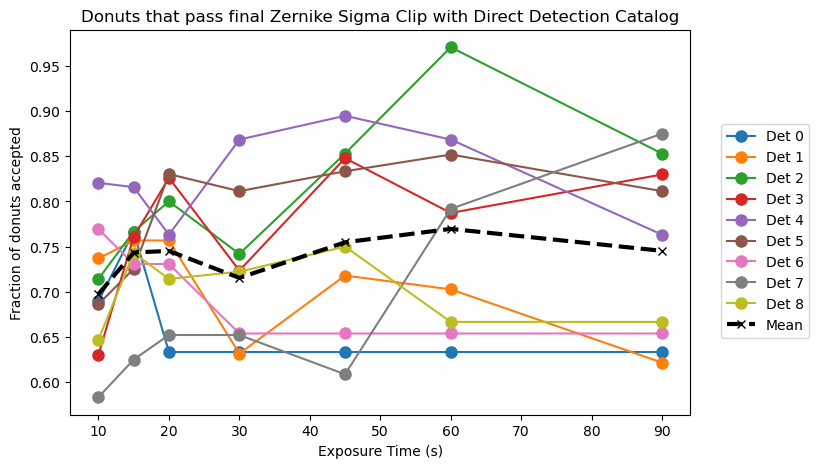

In [62]:
fig = plt.figure(figsize=(8, 5))

for det_num in range(9):
    plt.plot(exp_times, [x['numDonutsUsed']/x['numDonutsTotal'] for x in zern_metadata_direct[det_num].values()], '-o', label=f'Det {det_num}', markersize=8)
plt.plot(exp_times, np.mean(accepted_direct_donuts/total_direct_donuts, axis=0), '--x', c='k', lw=3, label='Mean')
plt.legend(ncol=1, loc=(1.05, 0.2))
plt.xlabel('Exposure Time (s)')
plt.ylabel('Fraction of donuts accepted')
plt.title('Donuts that pass final Zernike Sigma Clip with Direct Detection Catalog')
#plt.savefig('figures/sigma_clip_accepted_gaia_based.png')

Text(0.5, 1.0, 'Donuts that pass final Zernike Sigma Clip with Direct Detection Catalog')

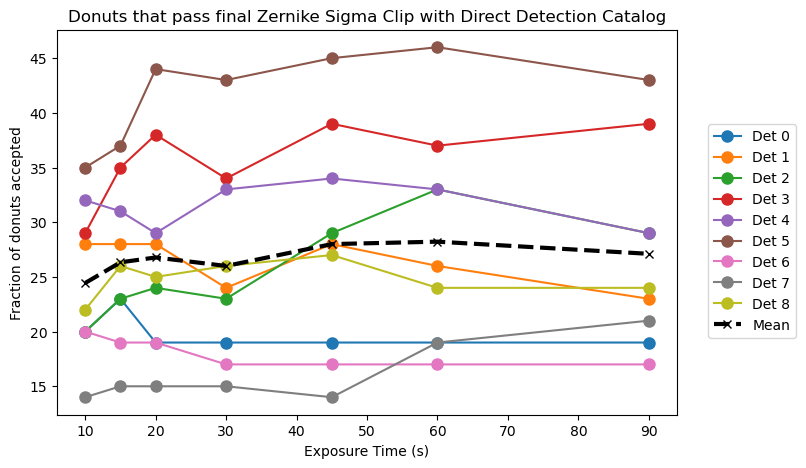

In [61]:
fig = plt.figure(figsize=(8, 5))

for det_num in range(9):
    plt.plot(exp_times, [x['numDonutsUsed'] for x in zern_metadata_direct[det_num].values()], '-o', label=f'Det {det_num}', markersize=8)
plt.plot(exp_times, np.mean(accepted_direct_donuts, axis=0), '--x', c='k', lw=3, label='Mean')
plt.legend(ncol=1, loc=(1.05, 0.2))
plt.xlabel('Exposure Time (s)')
plt.ylabel('Fraction of donuts accepted')
plt.title('Donuts that pass final Zernike Sigma Clip with Direct Detection Catalog')
#plt.savefig('figures/sigma_clip_accepted_gaia_based.png')

Text(0.5, 1.0, 'Donuts that pass final Zernike Sigma Clip with Direct Detection Catalog')

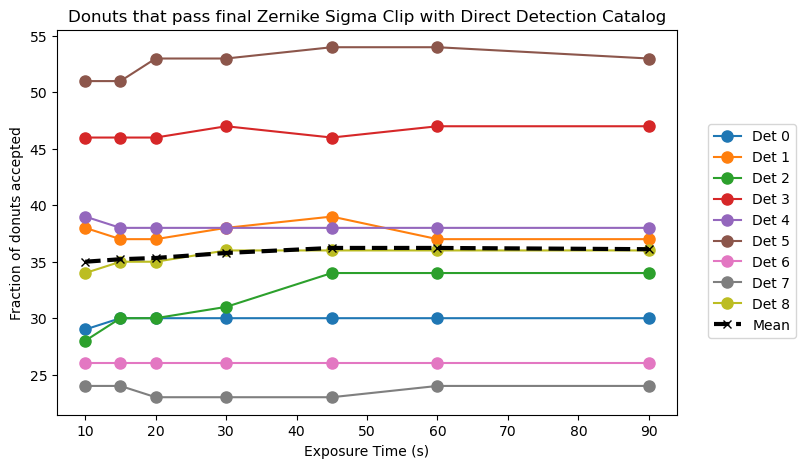

In [63]:
fig = plt.figure(figsize=(8, 5))

for det_num in range(9):
    plt.plot(exp_times, [x['numDonutsTotal'] for x in zern_metadata_direct[det_num].values()], '-o', label=f'Det {det_num}', markersize=8)
plt.plot(exp_times, np.mean(total_direct_donuts, axis=0), '--x', c='k', lw=3, label='Mean')
plt.legend(ncol=1, loc=(1.05, 0.2))
plt.xlabel('Exposure Time (s)')
plt.ylabel('Fraction of donuts accepted')
plt.title('Donuts that pass final Zernike Sigma Clip with Direct Detection Catalog')
#plt.savefig('figures/sigma_clip_accepted_gaia_based.png')

In [21]:
list(butler.registry.queryDatasets('donutVisitPairTable', collections='WET-013'))

[DatasetRef(DatasetType('donutVisitPairTable', {instrument}, AstropyTable), {instrument: 'LSSTComCamSim'}, run='WET-013/20240702T223722Z', id=0445647e-3a8f-4af2-b8de-d3e12e03b0ee)]

In [32]:
list(butler.registry.queryDatasets('donutStampsIntra', collections='WET-013/directDetectCatalog'))

[DatasetRef(DatasetType('donutStampsIntra', {band, instrument, detector, physical_filter, visit}, StampsBase), {instrument: 'LSSTComCamSim', detector: 5, visit: 7024072600012, band: 'r', physical_filter: 'r_03'}, run='WET-013/directDetectCatalog/20240703T224953Z', id=9ce7c088-b241-4827-853a-07c66f015c02),
 DatasetRef(DatasetType('donutStampsIntra', {band, instrument, detector, physical_filter, visit}, StampsBase), {instrument: 'LSSTComCamSim', detector: 6, visit: 7024072600006, band: 'r', physical_filter: 'r_03'}, run='WET-013/directDetectCatalog/20240703T224953Z', id=d1def720-0e0b-4da3-8a2a-ce0ff913f64a),
 DatasetRef(DatasetType('donutStampsIntra', {band, instrument, detector, physical_filter, visit}, StampsBase), {instrument: 'LSSTComCamSim', detector: 6, visit: 7024072600018, band: 'r', physical_filter: 'r_03'}, run='WET-013/directDetectCatalog/20240703T224953Z', id=54b71522-e2ac-4d10-8ab9-f1e9b2032410),
 DatasetRef(DatasetType('donutStampsIntra', {band, instrument, detector, physic

In [52]:
butler.get('donutVisitPairTable', dataId={'instrument': 'LSSTComCamSim'}, collections='WET-013/directDetectCatalog')

extra,intra,extra_ra,extra_dec,extra_mjd,extra_focusZ,extra_rtp,intra_ra,intra_dec,intra_mjd,intra_focusZ,intra_rtp
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
7024072600003,7024072600001,3.692992924287214,-0.46569506183681403,60518.00194787037,1.5,-359.78182915546705,3.692992924287214,-0.46569506183681403,60518.00194787037,-1.5,-359.78182915546705
7024072600006,7024072600004,3.692992924287214,-0.46569506183681403,60518.00197680556,1.5,-359.7837449293443,3.692992924287214,-0.46569506183681403,60518.00197680556,-1.5,-359.7837449293443
7024072600009,7024072600007,3.692992924287214,-0.46569506183681403,60518.00200574074,1.5,-359.78565674659967,3.692992924287214,-0.46569506183681403,60518.00200574074,-1.5,-359.78565674659967
7024072600012,7024072600010,3.692992924287214,-0.46569506183681403,60518.002063611115,1.5,-359.7894685313364,3.692992924287214,-0.46569506183681403,60518.002063611115,-1.5,-359.7894685313364
7024072600015,7024072600013,3.692992924287214,-0.46569506183681403,60518.002150416665,1.5,-359.79515665912555,3.692992924287214,-0.46569506183681403,60518.002150416665,-1.5,-359.79515665912555
7024072600018,7024072600016,3.692992924287214,-0.46569506183681403,60518.00223722222,1.5,-359.80080944745976,3.692992924287214,-0.46569506183681403,60518.00223722222,-1.5,-359.80080944745976
7024072600021,7024072600019,3.692992924287214,-0.46569506183681403,60518.00241083333,1.5,-359.8120095412792,3.692992924287214,-0.46569506183681403,60518.00241083333,-1.5,-359.8120095412792


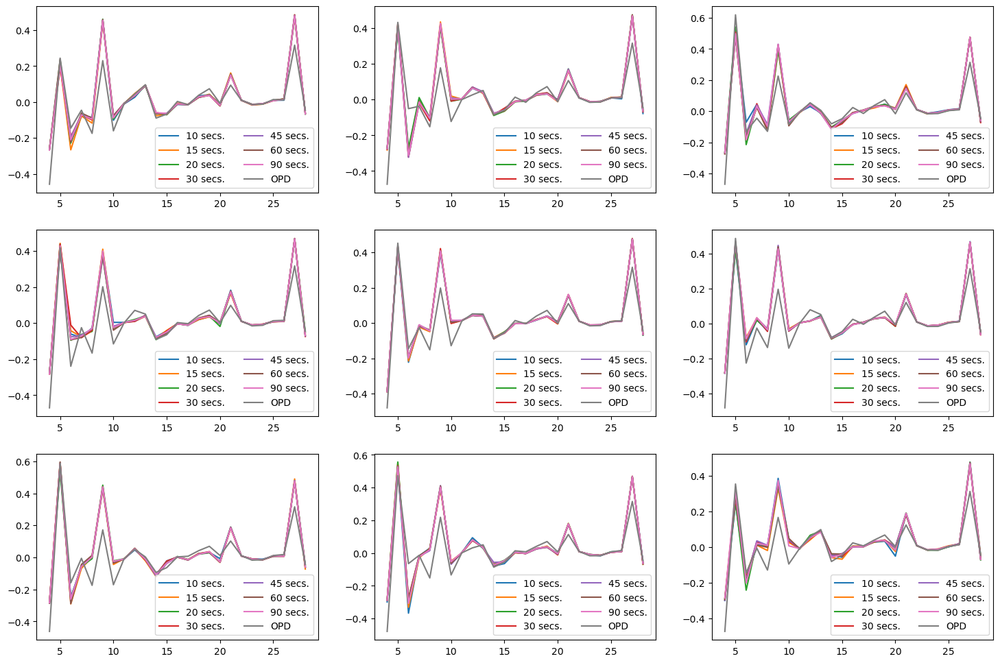

In [50]:
fig = plt.figure(figsize=(18, 12))
for det_num in range(9):
    fig.add_subplot(3,3,det_num+1)
    for exp_time in exp_times:
        plt.plot(np.arange(4, 29), zern_avg_wcs[det_num][exp_time], label=f'{exp_time} secs.')
    plt.plot(np.arange(4, 29), det_opd[det_num], label='OPD')
    plt.legend(ncol=2)

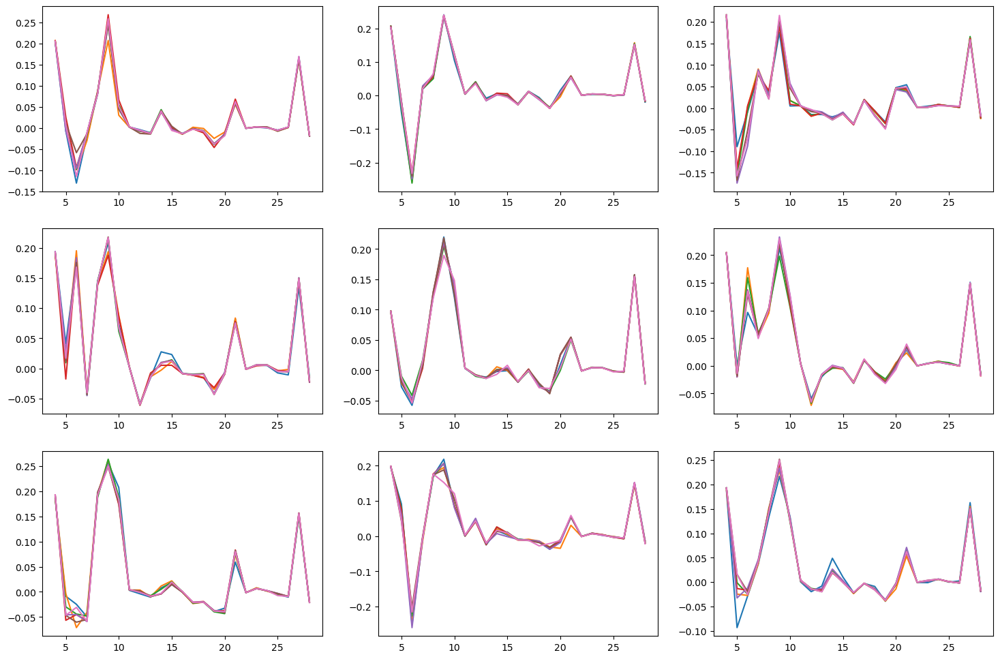

In [51]:
fig = plt.figure(figsize=(18, 12))
for det_num in range(9):
    fig.add_subplot(3,3,det_num+1)
    for exp_time in exp_times:
       plt.plot(np.arange(4, 29), zern_avg_direct[det_num][exp_time]-det_opd[det_num], label=f'{exp_time} secs.')

In [6]:
from lsst.ts.wep.task import CalcZernikesTask, CalcZernikesTaskConfig, DonutStamps

In [16]:
config = CalcZernikesTaskConfig()
config.estimateZernikes.maxNollIndex=28

In [17]:
config

lsst.ts.wep.task.calcZernikesTask.CalcZernikesTaskConfig(saveLogOutput=True, estimateZernikes={'instConfigFile': None, 'maxNollIndex': 28, 'startWithIntrinsic': True, 'returnWfDev': False, 'return4Up': True, 'units': 'um', 'usePairs': True, 'saveHistory': False, 'opticalModel': 'offAxis', 'maxIter': 30, 'compSequence': [4, 4, 6, 6, 13, 13, 13, 13, 22, 22, 22, 22], 'compGain': 0.6, 'centerTol': 1e-09, 'centerBinary': True, 'convergeTol': 1e-09, 'maskKwargs': {}}, combineZernikes={'sigmaClipKwargs': {}, 'stdMin': 0.005, 'maxZernClip': 3}, connections={'donutStampsExtra': 'donutStampsExtra', 'donutStampsIntra': 'donutStampsIntra', 'outputZernikesRaw': 'zernikeEstimateRaw', 'outputZernikesAvg': 'zernikeEstimateAvg'})

In [18]:
task = CalcZernikesTask(config=config)

In [19]:
out_60 = task.run(
    DonutStamps(donut_stamps_extra_wcs[0][60][:5]), 
    DonutStamps(donut_stamps_intra_wcs[0][60][:5])
)

In [20]:
out_90 = task.run(
    DonutStamps(donut_stamps_extra_wcs[0][90][:5]), 
    DonutStamps(donut_stamps_intra_wcs[0][90][:5])
)

In [21]:
out_10 = task.run(
    DonutStamps(donut_stamps_extra_wcs[0][10][:5]), 
    DonutStamps(donut_stamps_intra_wcs[0][10][:5])
)

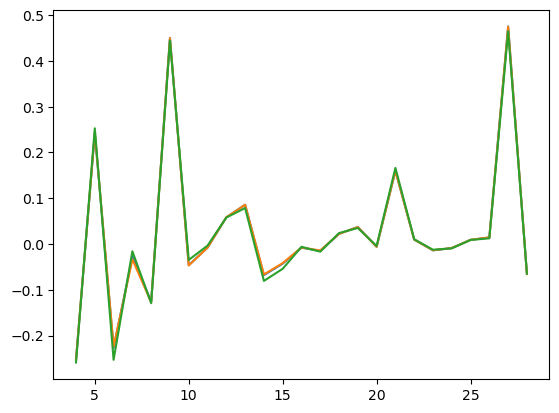

In [23]:
plt.plot(np.arange(4, 29), out_10.outputZernikesAvg, label=f'{exp_time} secs.')
plt.plot(np.arange(4, 29), out_60.outputZernikesAvg, label=f'{exp_time} secs.')
plt.plot(np.arange(4, 29), out_90.outputZernikesAvg, label=f'{exp_time} secs.')

In [28]:
out_60 = task.run(
    DonutStamps(donut_stamps_extra_direct[2][60][:5]), 
    DonutStamps(donut_stamps_intra_direct[2][60][:5])
)

In [29]:
out_90 = task.run(
    DonutStamps(donut_stamps_extra_direct[2][90][:5]), 
    DonutStamps(donut_stamps_intra_direct[2][90][:5])
)

In [32]:
out_10 = task.run(
    DonutStamps(donut_stamps_extra_direct[2][10][:5]), 
    DonutStamps(donut_stamps_intra_direct[2][10][:5])
)

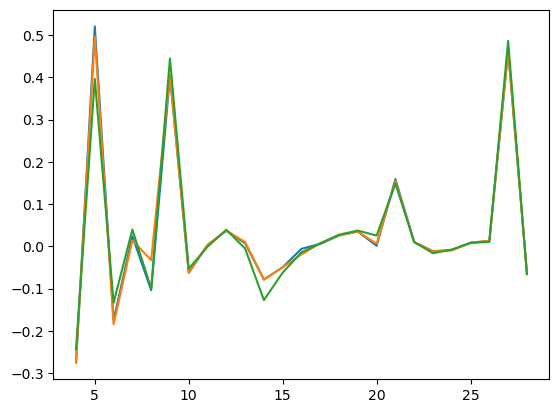

In [33]:
plt.plot(np.arange(4, 29), out_10.outputZernikesAvg, label=f'{exp_time} secs.')
plt.plot(np.arange(4, 29), out_60.outputZernikesAvg, label=f'{exp_time} secs.')
plt.plot(np.arange(4, 29), out_90.outputZernikesAvg, label=f'{exp_time} secs.')

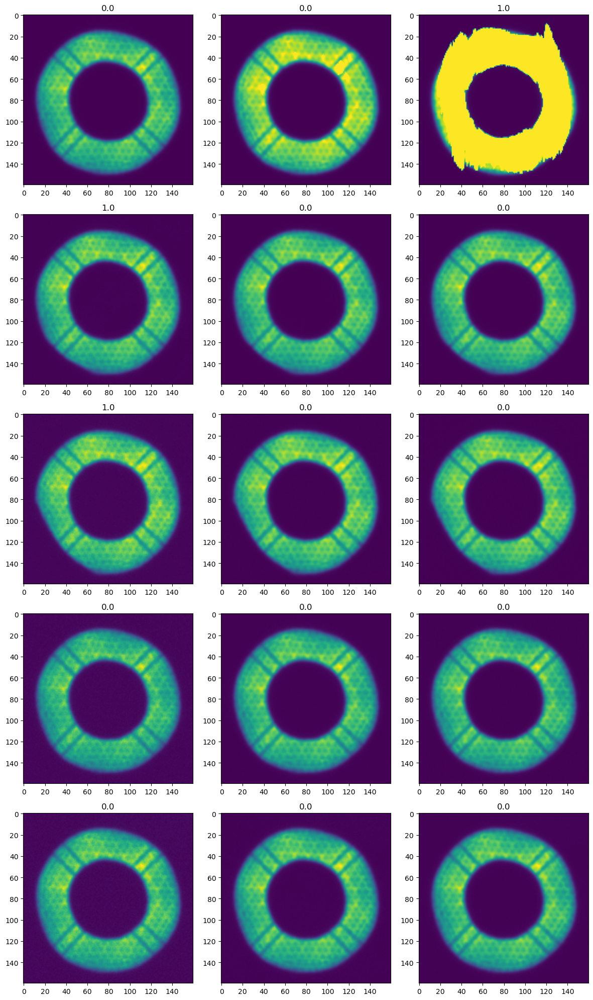

In [45]:
fig = plt.figure(figsize=(12, 20))
for i in range(5):
    fig.add_subplot(5,3,i*3+1)
    plt.imshow(donut_stamps_extra_direct[2][10][i].stamp_im.image.array)
    plt.title(zern_metadata_direct[2][10]['combineZernikesFlags'][i])
    fig.add_subplot(5,3,i*3+2)
    plt.imshow(donut_stamps_extra_direct[2][60][i].stamp_im.image.array)
    plt.title(zern_metadata_direct[2][60]['combineZernikesFlags'][i])
    fig.add_subplot(5,3,i*3+3)
    plt.imshow(donut_stamps_extra_direct[2][90][i].stamp_im.image.array)
    plt.title(zern_metadata_direct[2][90]['combineZernikesFlags'][i])
plt.tight_layout()

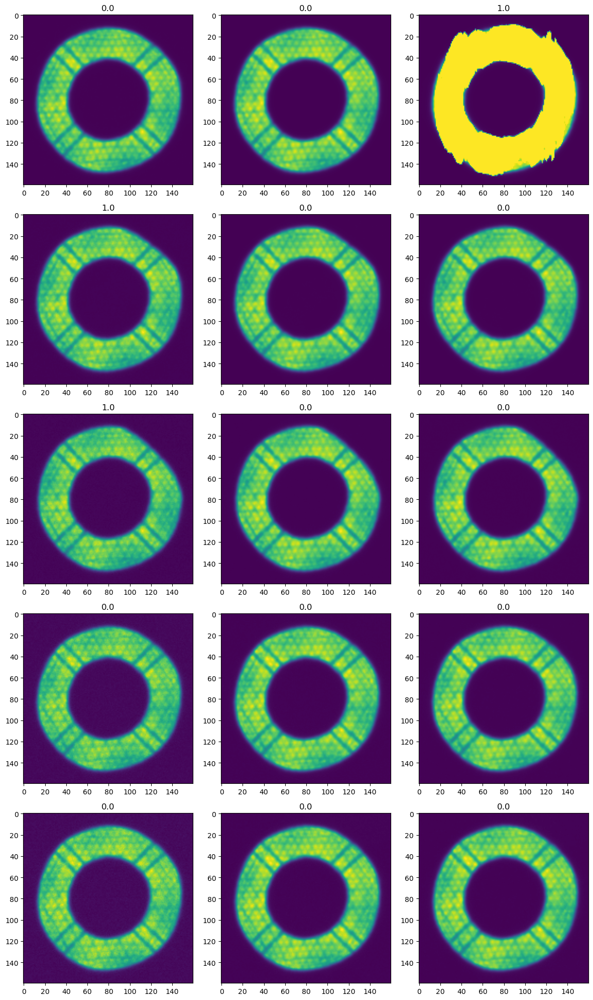

In [46]:
fig = plt.figure(figsize=(12, 20))
for i in range(5):
    fig.add_subplot(5,3,i*3+1)
    plt.imshow(donut_stamps_intra_direct[2][10][i].stamp_im.image.array)
    plt.title(zern_metadata_direct[2][10]['combineZernikesFlags'][i])
    fig.add_subplot(5,3,i*3+2)
    plt.imshow(donut_stamps_intra_direct[2][60][i].stamp_im.image.array)
    plt.title(zern_metadata_direct[2][60]['combineZernikesFlags'][i])
    fig.add_subplot(5,3,i*3+3)
    plt.imshow(donut_stamps_intra_direct[2][90][i].stamp_im.image.array)
    plt.title(zern_metadata_direct[2][90]['combineZernikesFlags'][i])
plt.tight_layout()